# EDA of Solar Radiation Data for three countries.

In [2]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns


## Import data as dataframes

In [40]:
df1 = pd.read_csv('../data/benin-malanville.csv')
df2 = pd.read_csv('../data/sierraleone-bumbuna.csv')
df3 = pd.read_csv('../data/togo-dapaong_qc.csv')

region1 = 'Benin Melanville'
region2 = 'Sierraleone Bumbuna'
region3 = 'Togo Dapaong QC'


dfs = {
    region1: df1,
    region2: df2,
    region3: df3
}

In [41]:
for df in dfs.values():
    print(df.shape)

(525600, 19)
(525600, 19)
(525600, 19)


## Summary Statistics

In [42]:
def summary_statistics():
    for key, df in dfs.items():
        print('*********** ', 'Summary statistics for ',key, '*************', '\n')
        print(df.describe())

summary_statistics()

***********  Summary statistics for  Benin Melanville ************* 

                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      240.559452     167.187516     115.358961     236.589496   
std       331.131327     261.710501     158.691074     326.894859   
min       -12.900000      -7.800000     -12.600000       0.000000   
25%        -2.000000      -0.500000      -2.100000       0.000000   
50%         1.800000      -0.100000       1.600000       4.500000   
75%       483.400000     314.200000     216.300000     463.700000   
max      1413.000000     952.300000     759.200000    1342.300000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      228.883576      28.179683      54.487969       2.121113   
std       316.536515       5.924297      28.073069       1.603466   
min         0.000000      11.000

## Data Quality

In [44]:
def plot_separator(key):
    text = "*************************** " + key + " ***************************"
    return text

def data_quality():

    for key, df in dfs.items():
        # Missing values
        print(plot_separator(key))
        missing_dfs = df.isnull().sum()
        print(missing_dfs)

        # Negative dfs
        cols = ['GHI','DNI','DHI']

        for col in cols:
            print(f"col {col} has {len(df[df[col]<0])} negative dfs\n which is {round(len(df[df[col]<0])/len(df)*100,2)}% of the data")


        # Outliers
        cols = ['ModA','ModB','WS','WSgust']

        for col in cols:
            # Calculate Q1 (25th percentile) and Q3 (75th percentile)
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            # Interquartile range
            IQR = Q3 - Q1
            # Define bounds for outliers
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            # Find outliers
            outliers = len(df[(df[col] < lower_bound) | (df[col] > upper_bound)])
            print(f"col {col} has {outliers} outliers\n which is {round(outliers/len(df)*100,2)}% of the data")

data_quality()


*************************** Benin Melanville ***************************
Timestamp             0
GHI                   0
DNI                   0
DHI                   0
ModA                  0
ModB                  0
Tamb                  0
RH                    0
WS                    0
WSgust                0
WSstdev               0
WD                    0
WDstdev               0
BP                    0
Cleaning              0
Precipitation         0
TModA                 0
TModB                 0
Comments         525600
dtype: int64
col GHI has 258847 negative dfs
 which is 49.25% of the data
col DNI has 275987 negative dfs
 which is 52.51% of the data
col DHI has 259182 negative dfs
 which is 49.31% of the data
col ModA has 98 outliers
 which is 0.02% of the data
col ModB has 240 outliers
 which is 0.05% of the data
col WS has 6717 outliers
 which is 1.28% of the data
col WSgust has 5368 outliers
 which is 1.02% of the data
*************************** Sierraleone Bumbuna **********

### ! Take Actions for Quality data

In [45]:
  # Replace negative values with 0 and save it to dfs.
cols = ['GHI','DNI','DHI']
for key, df in dfs.items():
    for col in cols:
        df[col] = df[col].clip(lower=0)

for key, df in dfs.items():
    print(df.describe())
        
    

                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      241.958821     167.441866     116.993033     236.589496   
std       330.101787     261.547532     157.463619     326.894859   
min         0.000000       0.000000       0.000000       0.000000   
25%         0.000000       0.000000       0.000000       0.000000   
50%         1.800000       0.000000       1.600000       4.500000   
75%       483.400000     314.200000     216.300000     463.700000   
max      1413.000000     952.300000     759.200000    1342.300000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      228.883576      28.179683      54.487969       2.121113   
std       316.536515       5.924297      28.073069       1.603466   
min         0.000000      11.000000       2.100000       0.000000   
25%         0.000000      24.2000

In [52]:
# Define a threshold for outliers
threshold = 2

# Specify columns to exclude
exclude_columns = ['Timestamp', 'Timestamp_Adjusted', 'Comments']

# Columns to process for outlier detection
cols = ['ModA', 'ModB', 'WS', 'WSgust']

def replace_outliers_with_mean(dfs, threshold, exclude_columns, cols):
    print('Z-scores analysis')

    for key, df in dfs.items():
        print(plot_separator(key))
        
        for column in cols:
            if column in exclude_columns or column not in df.columns:
                continue  # Skip excluded columns and columns not in the DataFrame

            # Calculate mean and standard deviation
            mean = df[column].mean()
            std_dev = df[column].std()
            
            # Calculate Z-scores
            z_scores = (df[column] - mean) / std_dev
            
            # Flag outliers and replace them with the mean
            df[column] = np.where(np.abs(z_scores) > threshold, mean, df[column])
        
    
       
        
        dfs[key] = df
    
    return dfs

# Apply the function to the DataFrame, excluding specified columns
dfs = replace_outliers_with_mean(dfs, threshold, exclude_columns, cols)


for key, df in dfs.items():
    print(df.describe())




Z-scores analysis
*************************** Benin Melanville ***************************
*************************** Sierraleone Bumbuna ***************************
*************************** Togo Dapaong QC ***************************
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      241.958821     167.441866     116.993033     143.704430   
min         0.000000       0.000000       0.000000       0.000000   
25%         0.000000       0.000000       0.000000       0.000000   
50%         1.800000       0.000000       1.600000       4.500000   
75%       483.400000     314.200000     216.300000     236.589496   
max      1413.000000     952.300000     759.200000     737.000000   
std       330.101787     261.547532     157.463619     200.916765   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
m

## Time Series Analysis | Radiance

In [47]:
for key, df in dfs.items():
    df['Timestamp_Adjusted'] = pd.to_datetime(df['Timestamp'])

dfs_selected_month = {}
dfs_selected_day = {}

for key, df in dfs.items():
    df['Timestamp_Adjusted'] = pd.to_datetime(df['Timestamp_Adjusted'])
    filtered_df = df[(df['Timestamp_Adjusted'].dt.year == 2021) & (df['Timestamp_Adjusted'].dt.month == 11)]
    dfs_selected_month[key] = filtered_df

for key, df in dfs.items():
    if key == region1:
        df['Timestamp_Adjusted'] = pd.to_datetime(df['Timestamp_Adjusted'])
        filtered_df = df[df['Timestamp_Adjusted'].dt.date == pd.to_datetime('2021-08-09').date()]
        dfs_selected_day[key] = filtered_df

    

Time Series for solar radiance and Tamb
*************************** Benin Melanville ***************************


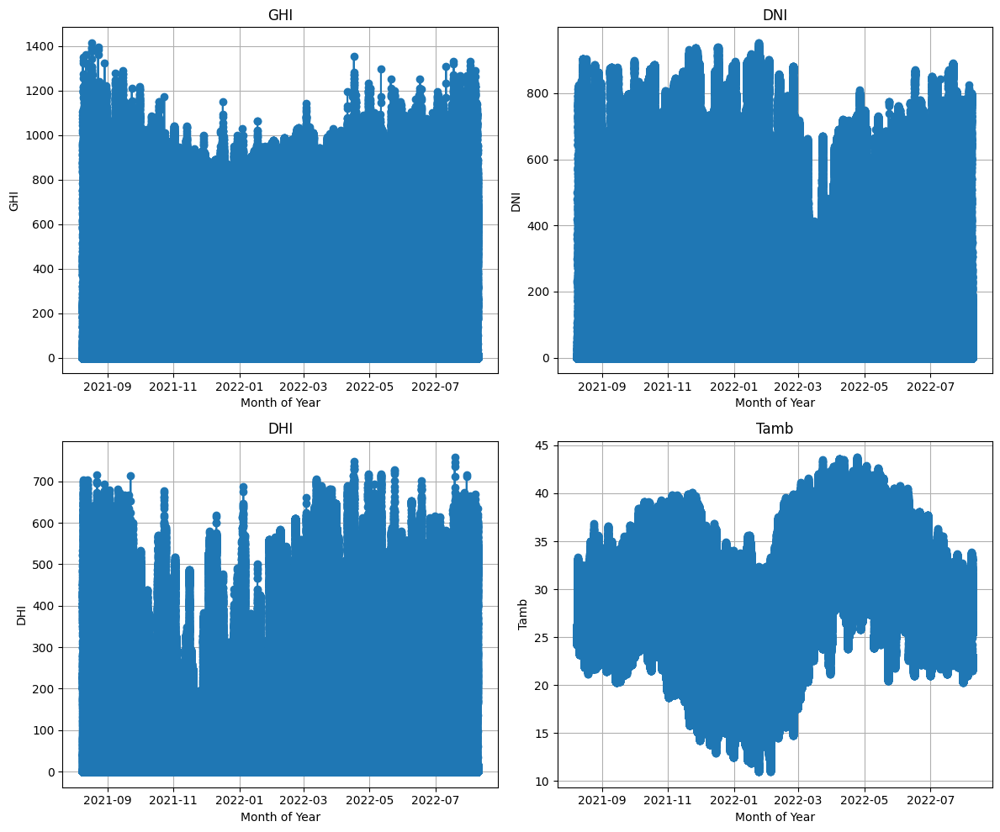

*************************** Sierraleone Bumbuna ***************************


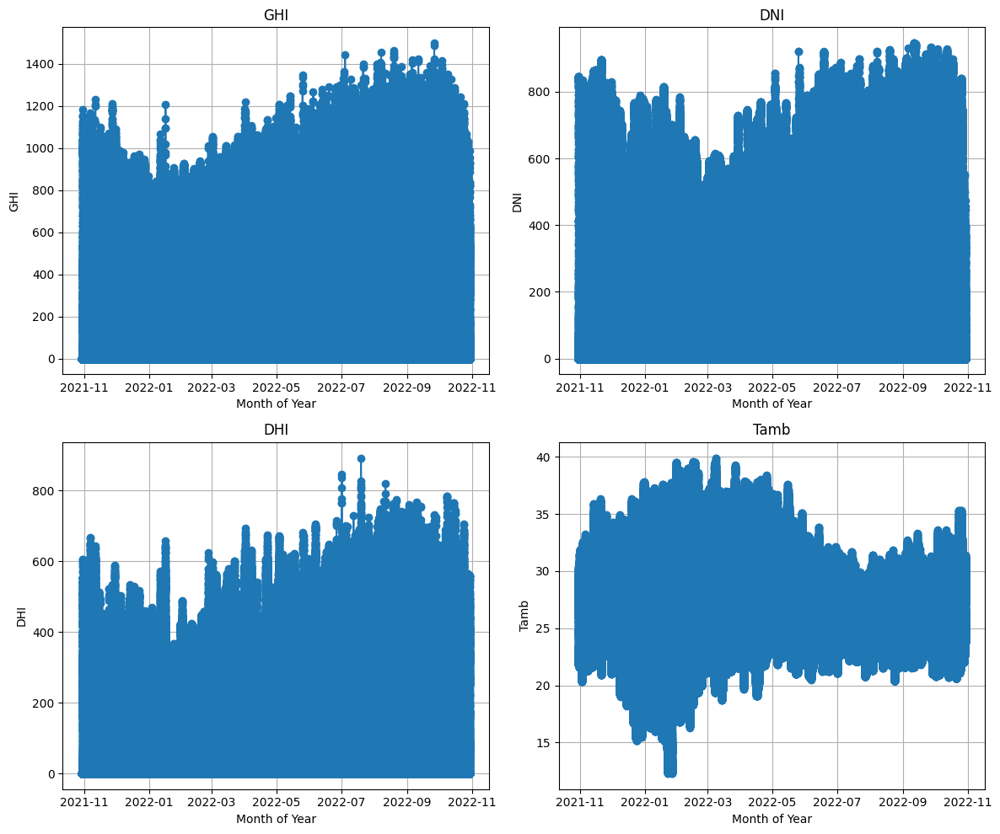

*************************** Togo Dapaong QC ***************************


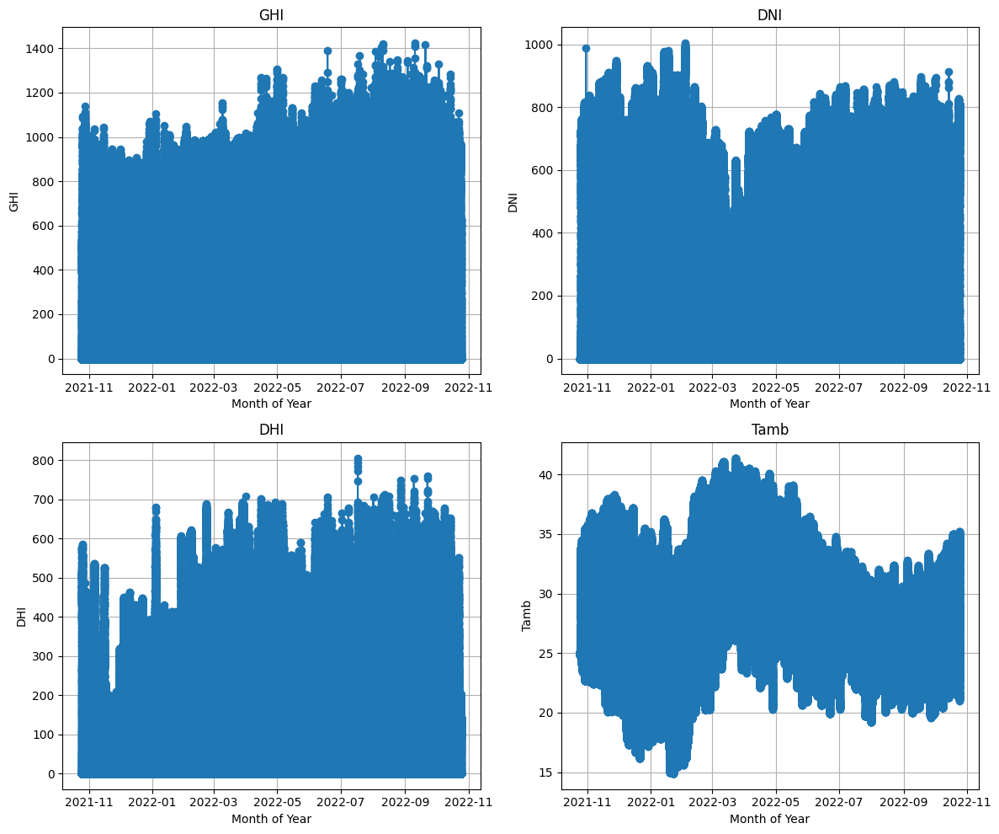

In [48]:
def time_series():
        # Accessbile time from Timestamp
    print("Time Series for solar radiance and Tamb")
    for key, df in dfs.items():
        print(plot_separator(key))
        
        # Create a 2x2 grid of subplots
        fig, axs = plt.subplots(2, 2, figsize=(12, 10))

        cols = ['GHI','DNI','DHI','Tamb']

        for i, col in enumerate(cols):
            # Plotting on each subplot
            if(i < 2):                  
                axs[0, i].plot(df['Timestamp_Adjusted'], df[col], marker='o', linestyle='-')
                axs[0, i].set_title("{}".format(col))
                axs[0, i].set_xlabel('Month of Year')
                axs[0, i].set_ylabel(col)
                axs[0, i].grid(True)
            else:
                axs[1, i-2].plot(df['Timestamp_Adjusted'], df[col], marker='o', linestyle='-')
                axs[1, i-2].set_title("{}".format(col))
                axs[1, i-2].set_xlabel('Month of Year')
                axs[1, i-2].set_ylabel(col)
                axs[1, i-2].grid(True)

        # Adjust layout
        plt.tight_layout()

        # Show the plot
        plt.show()


   
time_series()

#### Time Series Analysis | Radiance | Selected Month

Time Series for solar radiance and Tamb
*************************** Benin Melanville ***************************


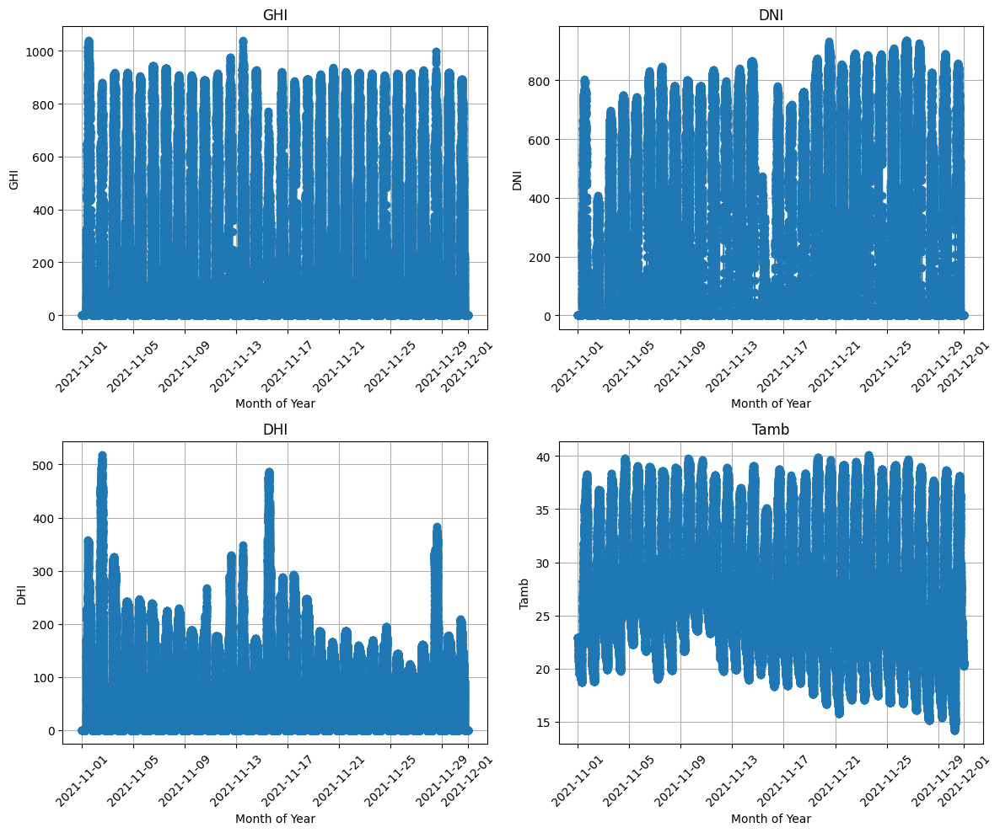

*************************** Sierraleone Bumbuna ***************************


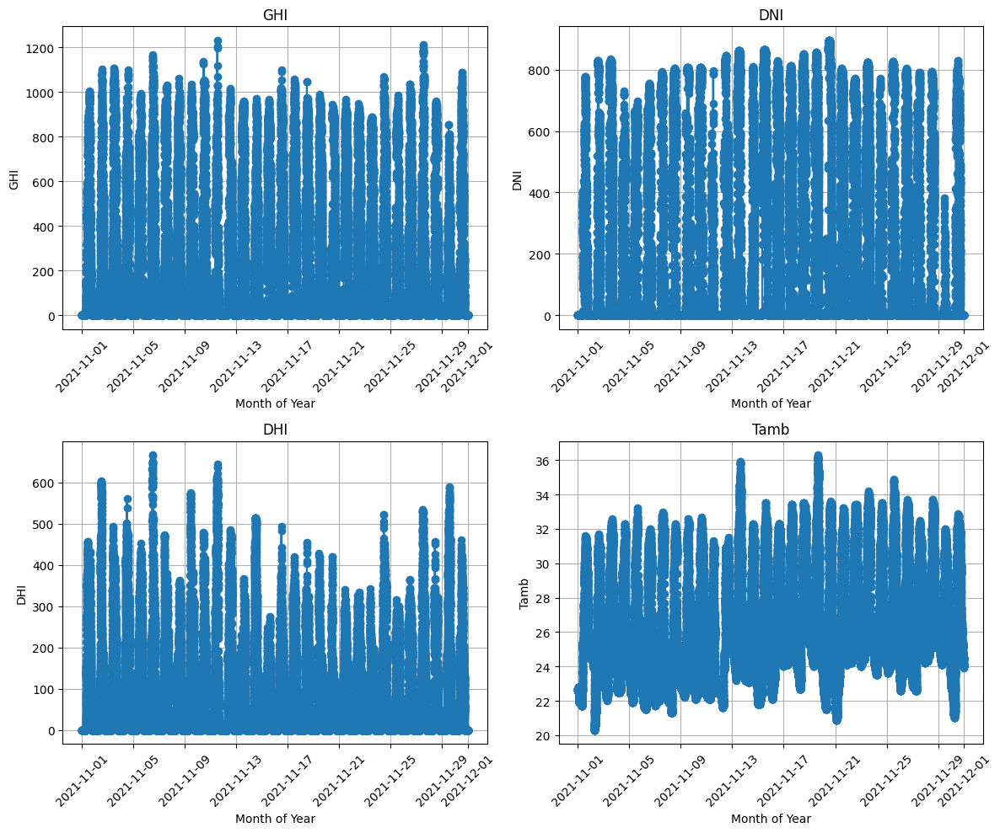

*************************** Togo Dapaong QC ***************************


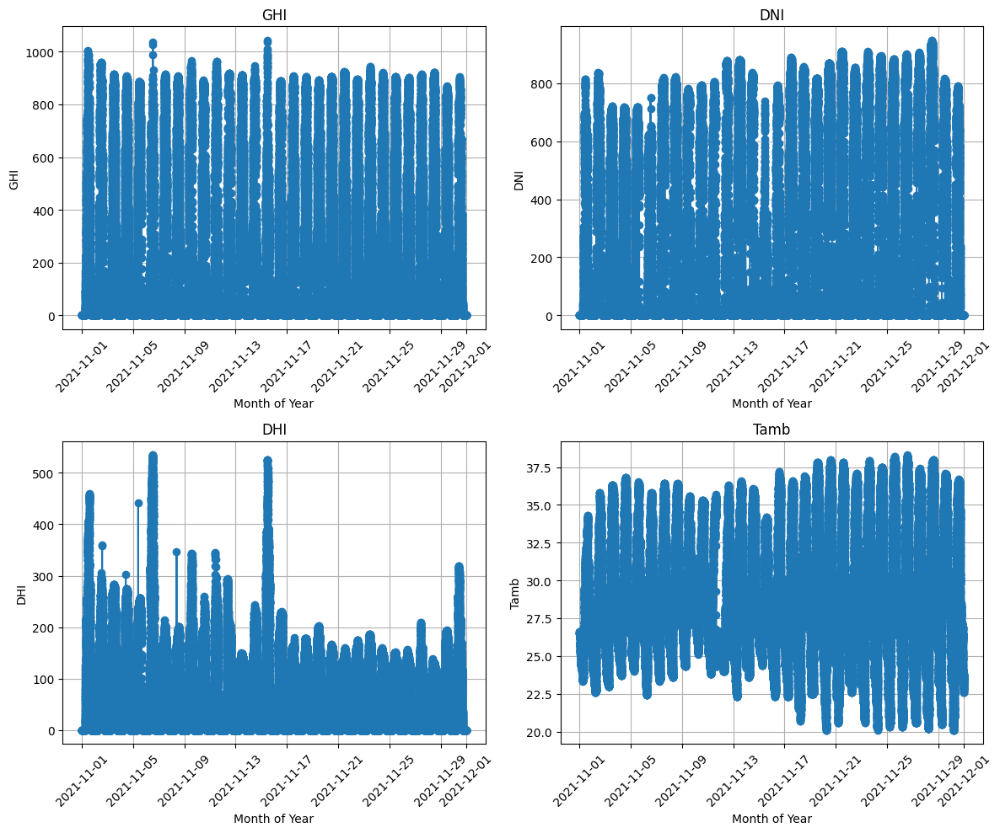

In [53]:
def time_series():
        # Accessbile time from Timestamp
    print("Time Series for solar radiance and Tamb")
    for key, df in dfs_selected_month.items():
        print(plot_separator(key))
        
        # Create a 2x2 grid of subplots
        fig, axs = plt.subplots(2, 2, figsize=(12, 10))

        cols = ['GHI','DNI','DHI','Tamb']

        for i, col in enumerate(cols):
            # Plotting on each subplot
            if(i < 2):                  
                axs[0, i].plot(df['Timestamp_Adjusted'], df[col], marker='o', linestyle='-')
                axs[0, i].set_title("{}".format(col))
                axs[0, i].set_xlabel('Month of Year')
                axs[0, i].set_ylabel(col)
                axs[0, i].grid(True)
                
                axs[0, i].tick_params(axis='x', rotation=45)  #
            else:
                axs[1, i-2].plot(df['Timestamp_Adjusted'], df[col], marker='o', linestyle='-')
                axs[1, i-2].set_title("{}".format(col))
                axs[1, i-2].set_xlabel('Month of Year')
                axs[1, i-2].set_ylabel(col)
                axs[1, i-2].grid(True)
                
                axs[1, i-2].tick_params(axis='x', rotation=45)

          


        # Adjust layout
        plt.tight_layout()

        # Show the plot
        plt.show()


   
time_series()

#### Time Series Analysis | Radiance | Selected Day for Benin Melanville

Time Series for solar radiance and Tamb
*************************** Benin Melanville ***************************


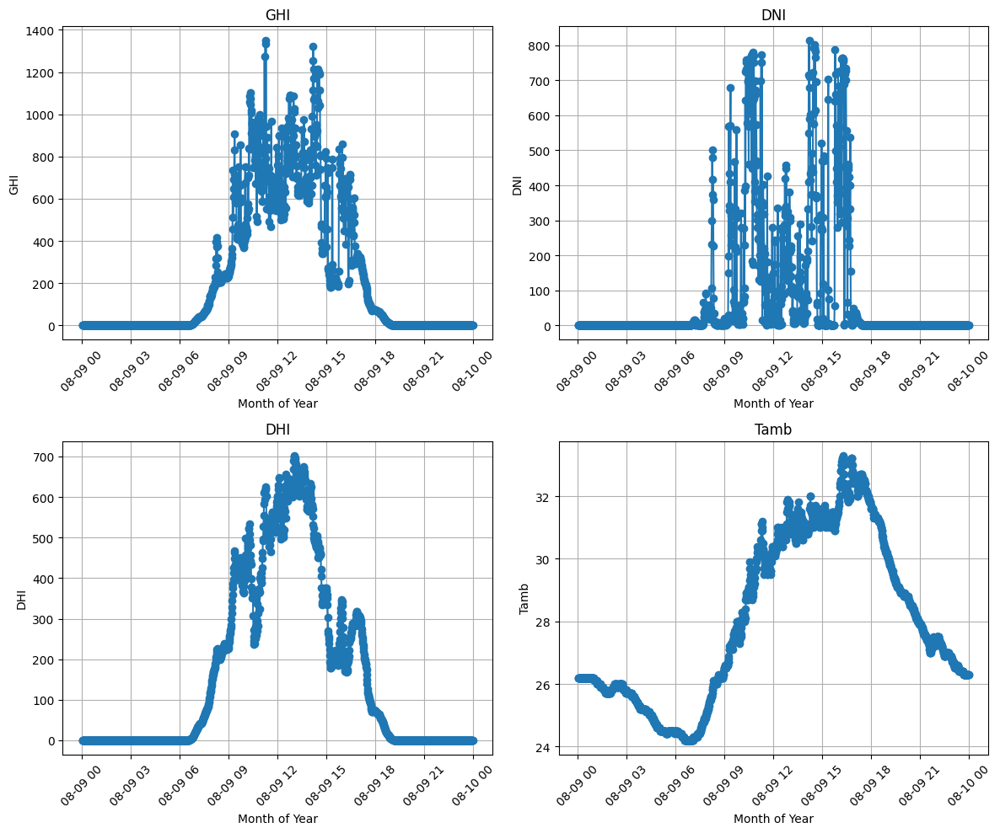

In [51]:
def time_series():
        # Accessbile time from Timestamp
    print("Time Series for solar radiance and Tamb")
    for key, df in dfs_selected_day.items():
        print(plot_separator(key))
        
        # Create a 2x2 grid of subplots
        fig, axs = plt.subplots(2, 2, figsize=(12, 10))

        cols = ['GHI','DNI','DHI','Tamb']

        for i, col in enumerate(cols):
            # Plotting on each subplot
            if(i < 2):                  
                axs[0, i].plot(df['Timestamp_Adjusted'], df[col], marker='o', linestyle='-')
                axs[0, i].set_title("{}".format(col))
                axs[0, i].set_xlabel('Month of Year')
                axs[0, i].set_ylabel(col)
                axs[0, i].grid(True)
                # Rotate x-axis labels
                axs[0, i].tick_params(axis='x', rotation=45)  #
            else:
                axs[1, i-2].plot(df['Timestamp_Adjusted'], df[col], marker='o', linestyle='-')
                axs[1, i-2].set_title("{}".format(col))
                axs[1, i-2].set_xlabel('Month of Year')
                axs[1, i-2].set_ylabel(col)
                axs[1, i-2].grid(True)

                axs[1, i-2].tick_params(axis='x', rotation=45)

        # Adjust layout
        plt.tight_layout()

        # Show the plot
        plt.show()


   
time_series()

## Effect of 'Cleaning' on ModA, ModB

Effect of 'Cleaning' on ModA, ModB 
*************************** Benin Melanville ***************************


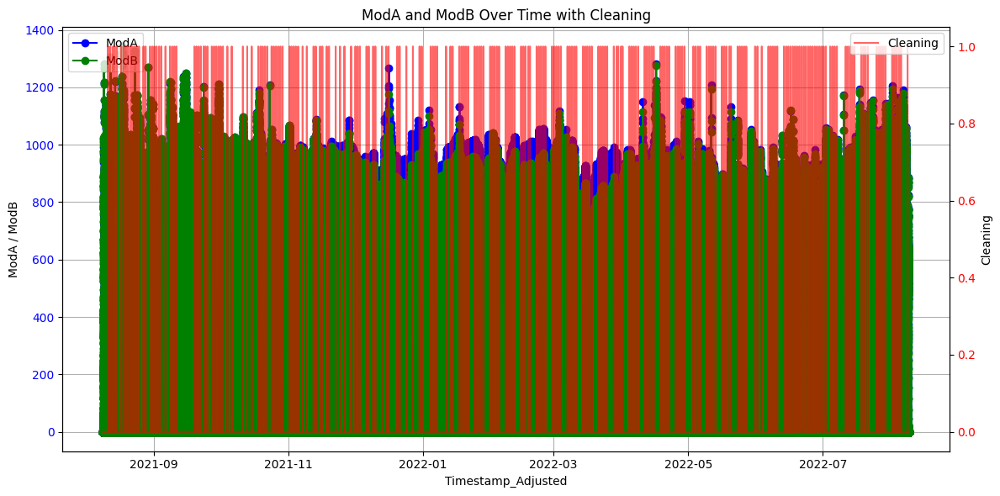

*************************** Sierraleone Bumbuna ***************************


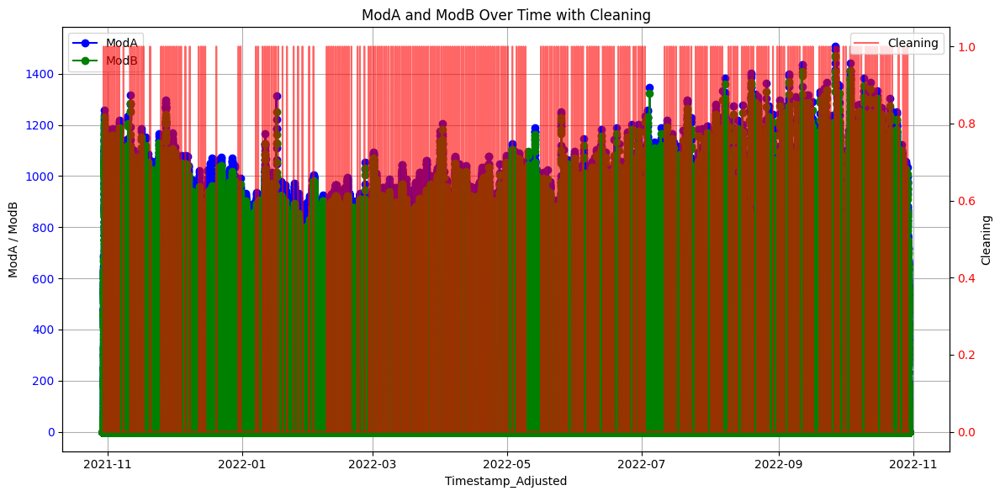

*************************** Togo Dapaong QC ***************************


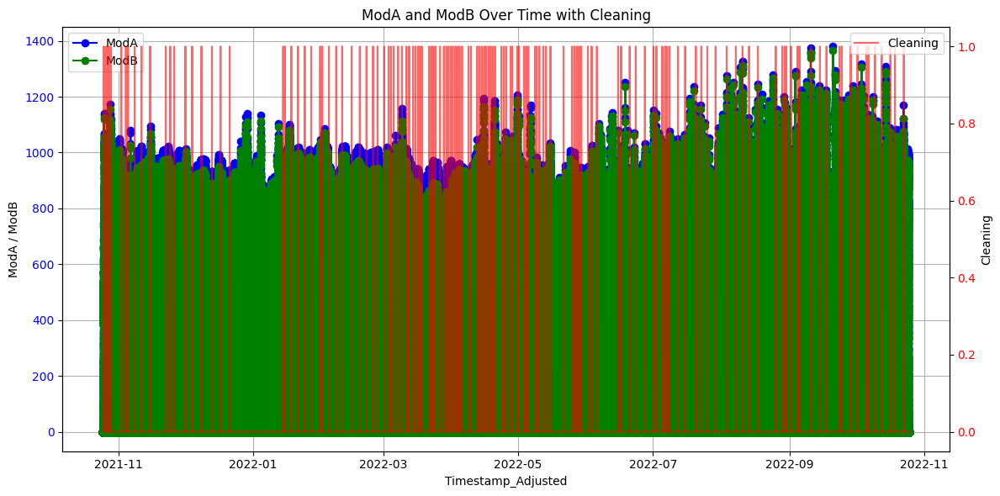

In [12]:
def cleaning_effect():

    print("Effect of 'Cleaning' on ModA, ModB ")
    
    for key, df in dfs.items():
        print(plot_separator(key))
        fig, ax1 = plt.subplots(figsize=(12, 6))
        # Plot 'ModA' and 'ModB' on the primary y-axis
        ax1.plot(df['Timestamp_Adjusted'], df['ModA'], marker='o', linestyle='-', color='b', label='ModA')
        ax1.plot(df['Timestamp_Adjusted'], df['ModB'], marker='o', linestyle='-', color='g', label='ModB')
        ax1.set_xlabel('Timestamp_Adjusted')
        ax1.set_ylabel('ModA / ModB')
        ax1.tick_params(axis='y', labelcolor='b')
        ax1.legend(loc='upper left')

        # Create a secondary y-axis for 'Cleaning'
        ax2 = ax1.twinx()
        ax2.plot(df['Timestamp_Adjusted'], df['Cleaning'], color='r', alpha=0.6, label='Cleaning')
        ax2.set_ylabel('Cleaning')
        ax2.tick_params(axis='y', labelcolor='r')
        ax2.legend(loc='upper right')

        # Title and grid
        plt.title('ModA and ModB Over Time with Cleaning')
        ax1.grid(True)

        # Show plot
        plt.tight_layout()
        plt.show()

cleaning_effect()

### Effect of 'Cleaning' on ModA, ModB | Selected Year and Month 2021-11

Effect of 'Cleaning' on ModA, ModB 
*************************** Benin Melanville ***************************


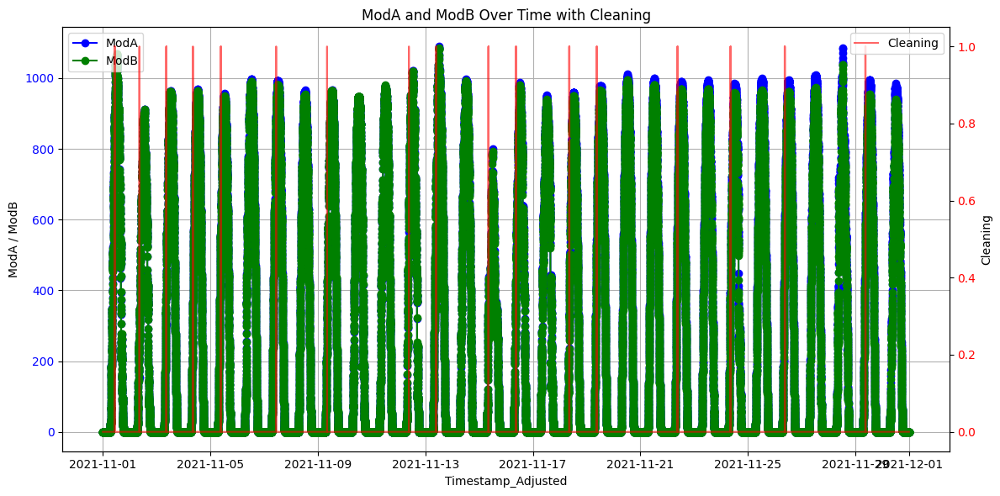

*************************** Sierraleone Bumbuna ***************************


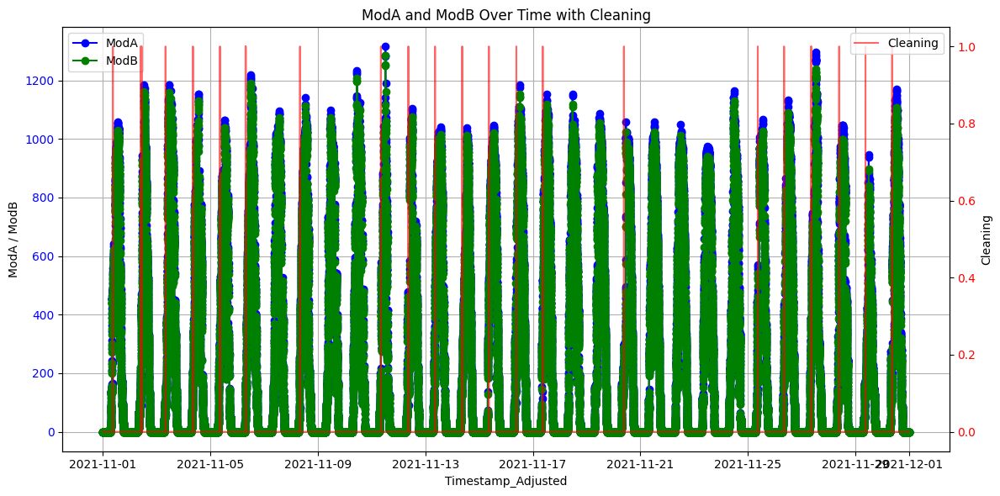

*************************** Togo Dapaong QC ***************************


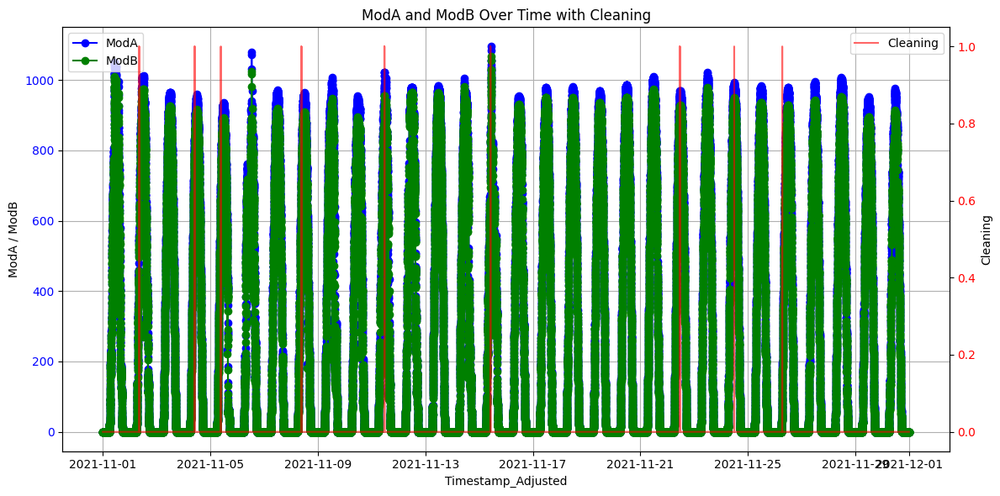

In [7]:
def cleaning_effect():

    print("Effect of 'Cleaning' on ModA, ModB ")
    
    for key, df in dfs_selected_month.items():
    
        print(plot_separator(key))
        fig, ax1 = plt.subplots(figsize=(12, 6))
        # Plot 'ModA' and 'ModB' on the primary y-axis
        ax1.plot(df['Timestamp_Adjusted'], df['ModA'], marker='o', linestyle='-', color='b', label='ModA')
        ax1.plot(df['Timestamp_Adjusted'], df['ModB'], marker='o', linestyle='-', color='g', label='ModB')
        ax1.set_xlabel('Timestamp_Adjusted')
        ax1.set_ylabel('ModA / ModB')
        ax1.tick_params(axis='y', labelcolor='b')
        ax1.legend(loc='upper left')

        # Create a secondary y-axis for 'Cleaning'
        ax2 = ax1.twinx()
        ax2.plot(df['Timestamp_Adjusted'], df['Cleaning'], color='r', alpha=0.6, label='Cleaning')
        ax2.set_ylabel('Cleaning')
        ax2.tick_params(axis='y', labelcolor='r')
        ax2.legend(loc='upper right')

        # Title and grid
        plt.title('ModA and ModB Over Time with Cleaning')
        ax1.grid(True)

        # Show plot
        plt.tight_layout()
        plt.show()

cleaning_effect()

    

## Correlation Analysis | Solar radiation, temperature, Wind

Correlation Analysis solar radiation, wind, ..


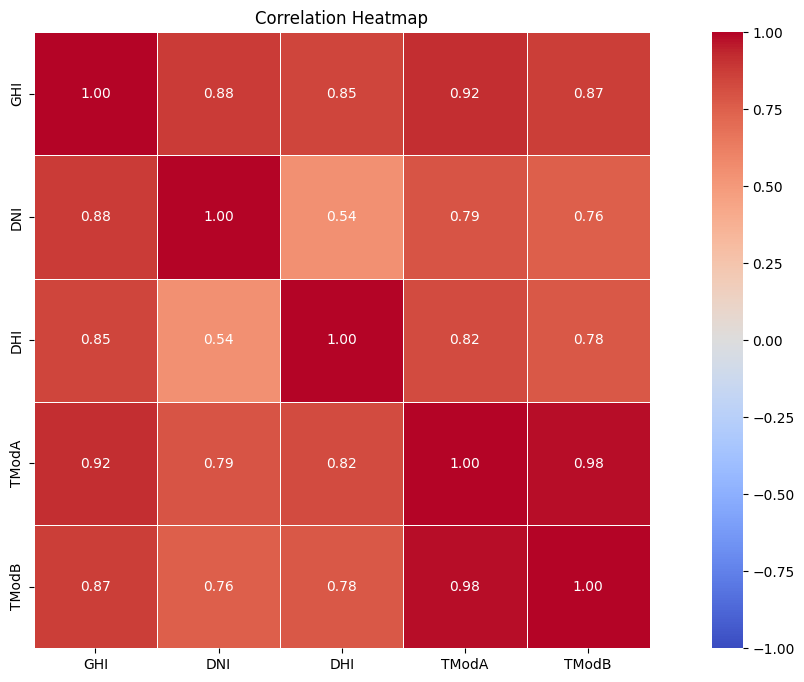

<Figure size 1600x800 with 0 Axes>

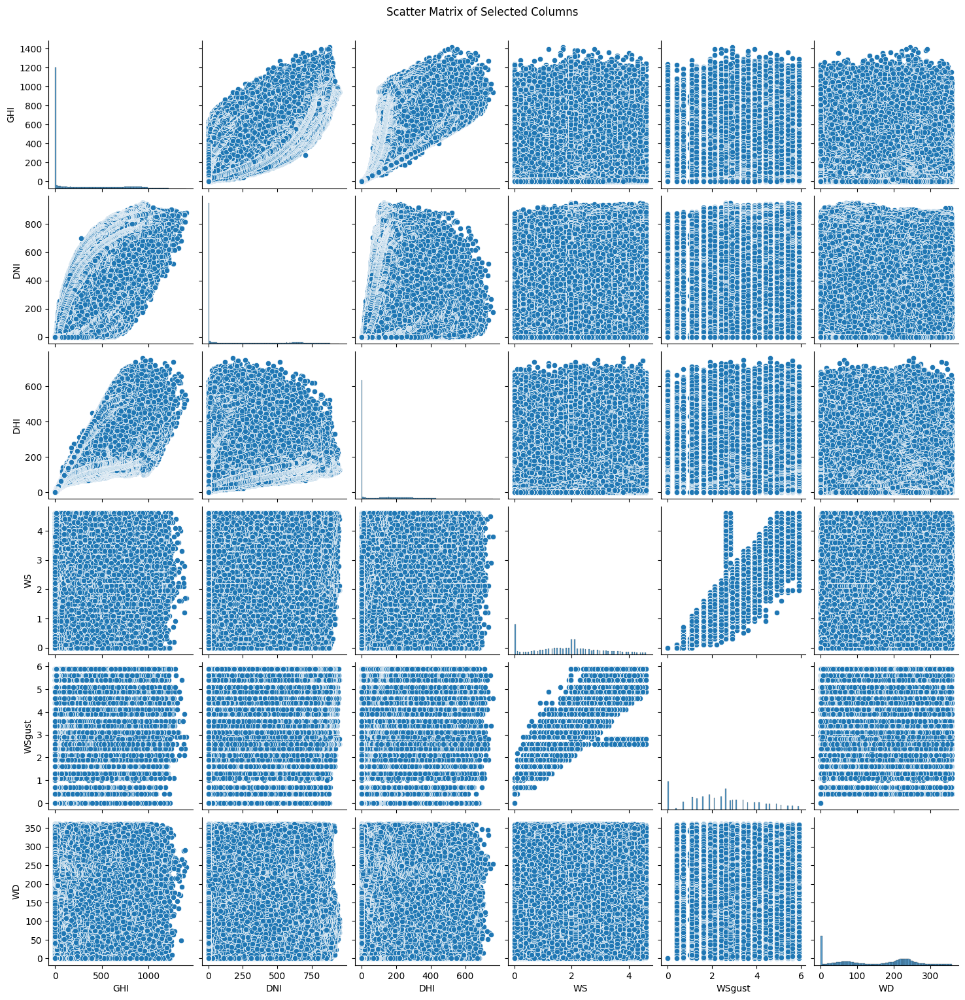

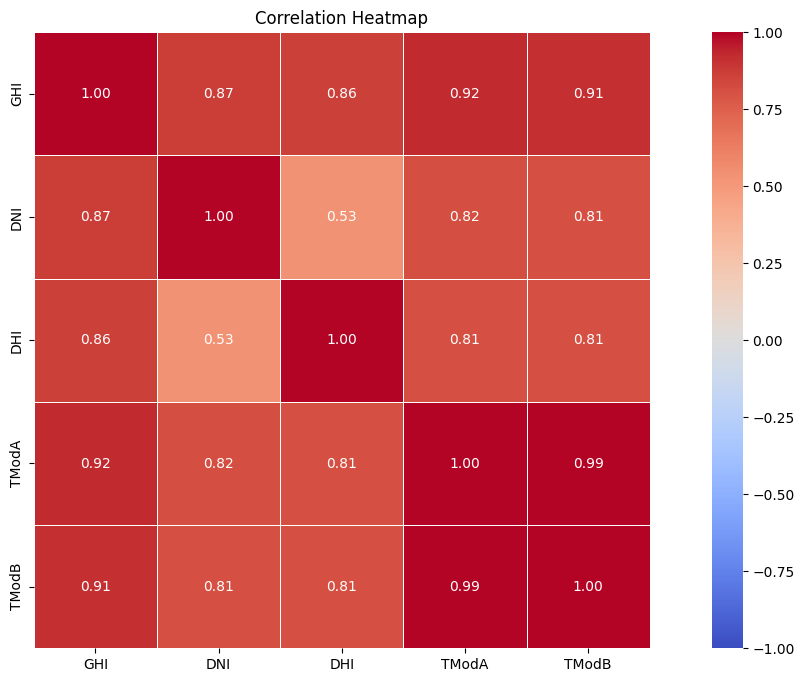

<Figure size 1600x800 with 0 Axes>

In [54]:

def correlation_analysis():
    print("Correlation Analysis solar radiation, wind, ..")
    for key, df in dfs.items():
        plot_separator(key)
        # Create a 1x2 grid of subplots
        fig2 = plt.figure(figsize=(16, 8))

        # Correlation heatmap
        corr_columns = ['GHI', 'DNI', 'DHI', 'TModA', 'TModB']
        df_selected = df[corr_columns]
        correlation_matrix = df_selected.corr()

        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, center=0, square=True, linewidths=0.5)
        plt.title('Correlation Heatmap')

        # Scatter matrix (pair plot)
        corr_columns = ['GHI', 'DNI', 'DHI', 'WS', 'WSgust', 'WD']
        df_selected = df[corr_columns]

        # Pair plot needs its own figure, so create a new figure
        fig2 = plt.figure(figsize=(16, 8))
        sns.pairplot(df_selected)
        plt.suptitle('Scatter Matrix of Selected Columns', y=1.02)

        # Show both plots
        plt.show()

correlation_analysis()


## Wind Analysis | 'WD' and 'WS'

Wind analysis WD and WS
*************************** Benin Melanville ***************************


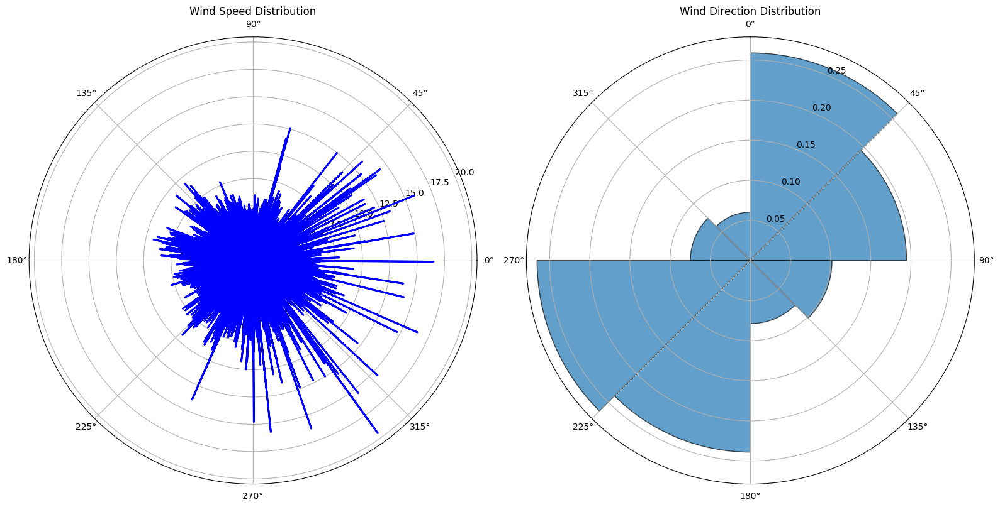

*************************** Sierraleone Bumbuna ***************************


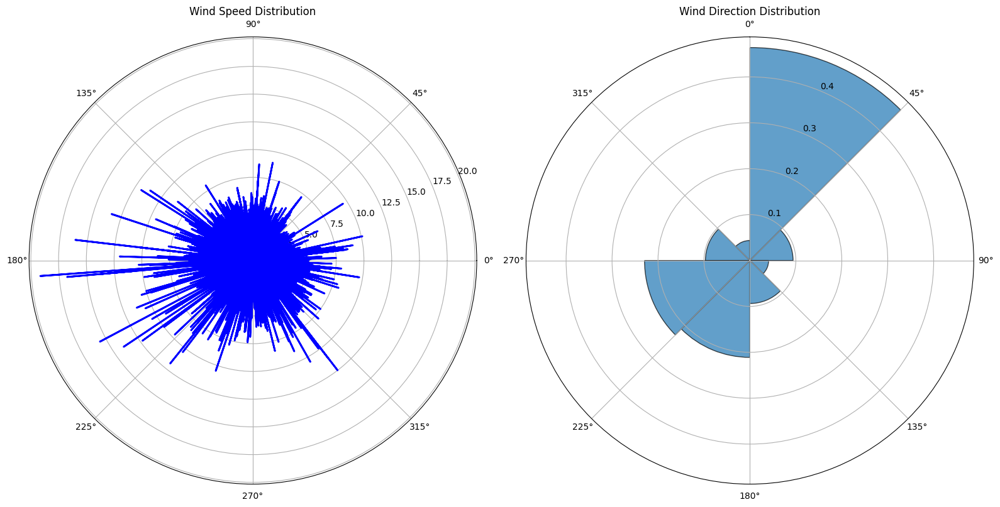

*************************** Togo Dapaong QC ***************************


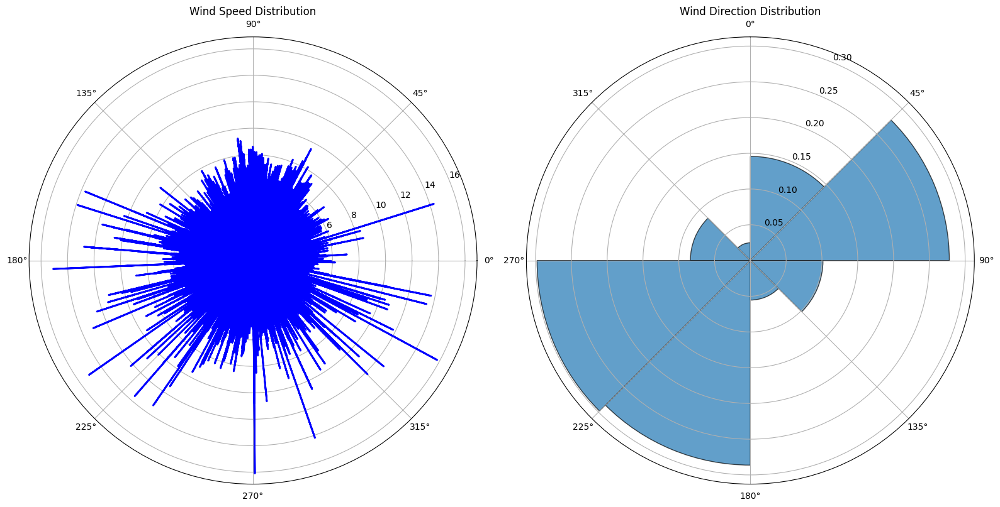

In [ ]:
def wind_analysis():
    print("Wind analysis WD and WS")

    for key, df in dfs.items():
        # Normalize wind direction for plotting
        print(plot_separator(key))
        df['WD_rad'] = np.deg2rad(df['WD'])

        # Create figure with two subplots
        fig, axs = plt.subplots(1, 2, subplot_kw=dict(projection='polar'), figsize=(16, 8))

        # Wind Speed Distribution (Radial Plot)
        angles = np.linspace(0, 2 * np.pi, len(df['WS']), endpoint=False).tolist()
        ws = df['WS'].tolist()

        # Close the circle by appending the start value to the end
        angles += angles[:1]
        ws += ws[:1]

        axs[0].fill(angles, ws, color='blue', alpha=0.25)
        axs[0].plot(angles, ws, color='blue', linewidth=2)
        axs[0].set_title('Wind Speed Distribution')

        # Wind Direction Distribution (Polar Histogram)
        n, bins, patches = axs[1].hist(df['WD_rad'], bins=8, edgecolor='black', alpha=0.7, density=True)
        axs[1].set_title('Wind Direction Distribution')
        axs[1].set_theta_zero_location('N')
        axs[1].set_theta_direction(-1)

        # Adjust layout
        plt.tight_layout()

        # Show the plot
        plt.show()

wind_analysis()


## Temperature Analysis | RH vs solar radiation and temperature

Temperature analysis


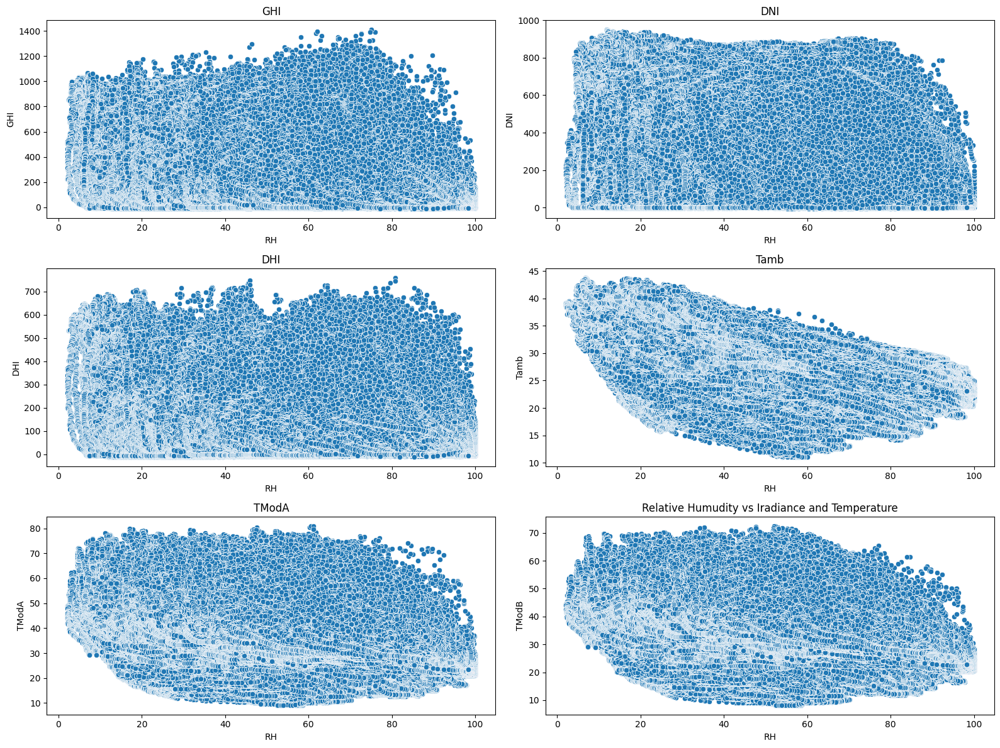

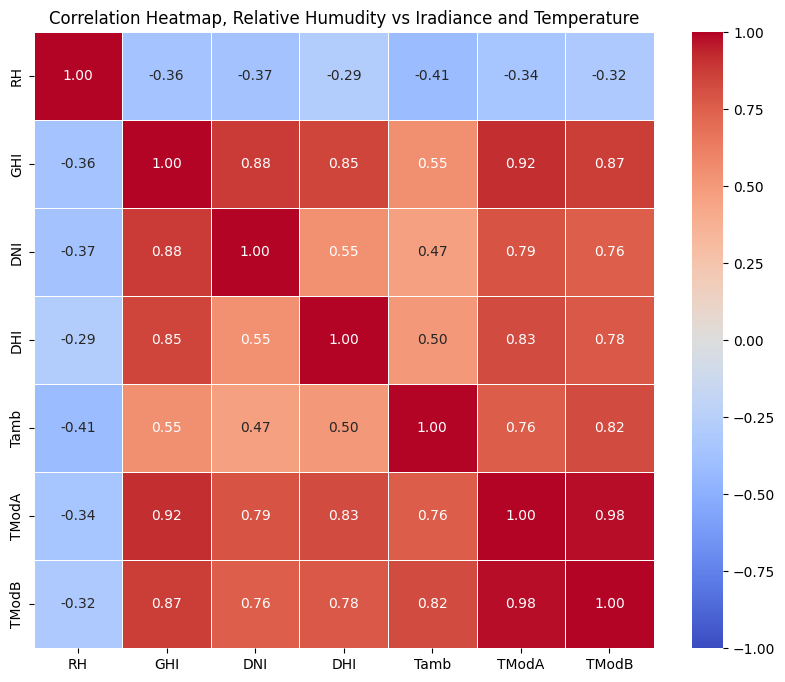

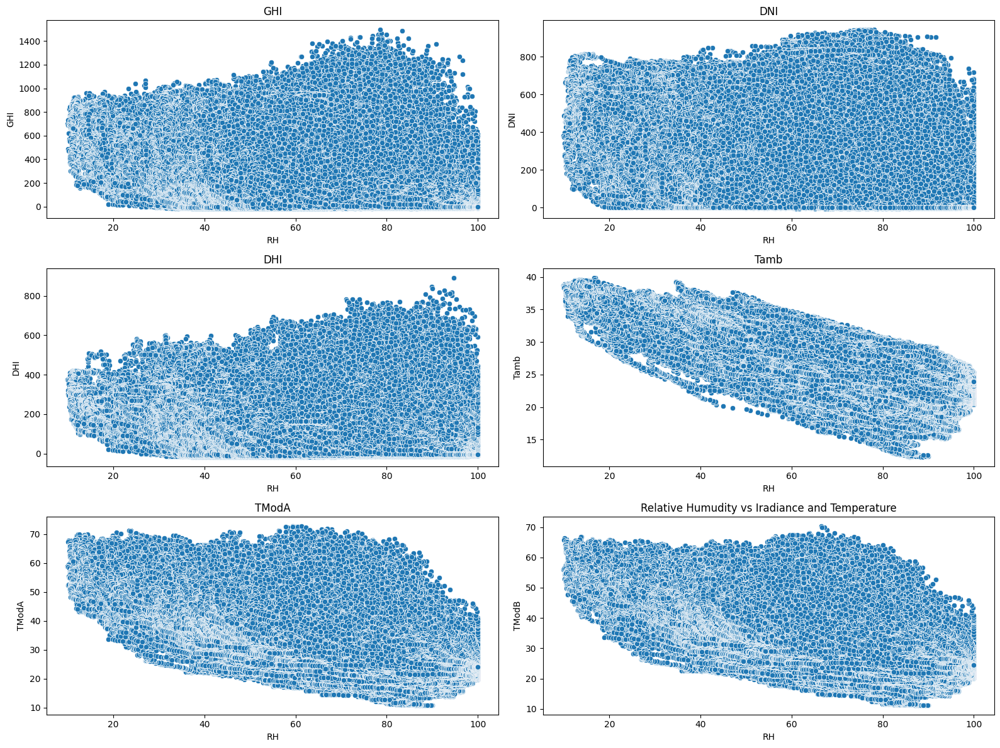

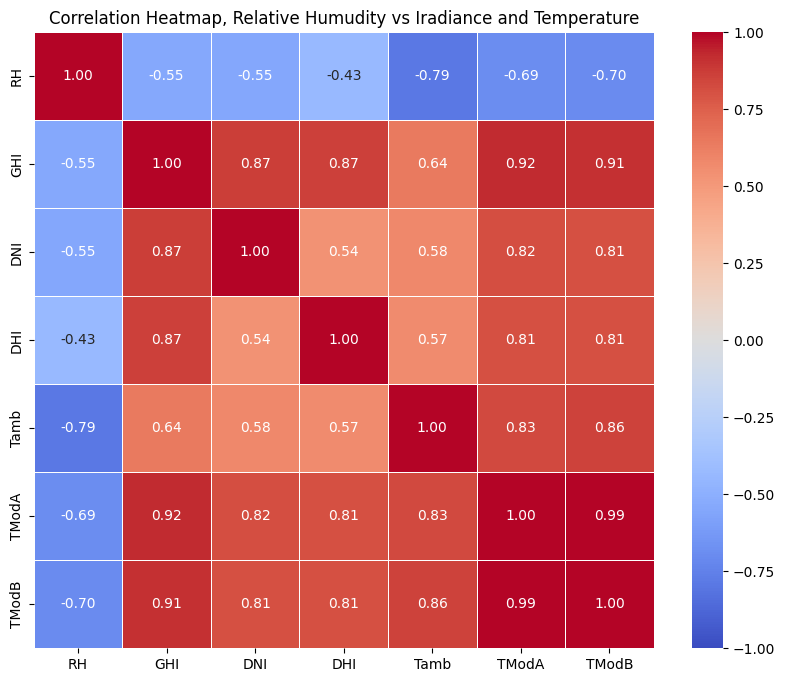

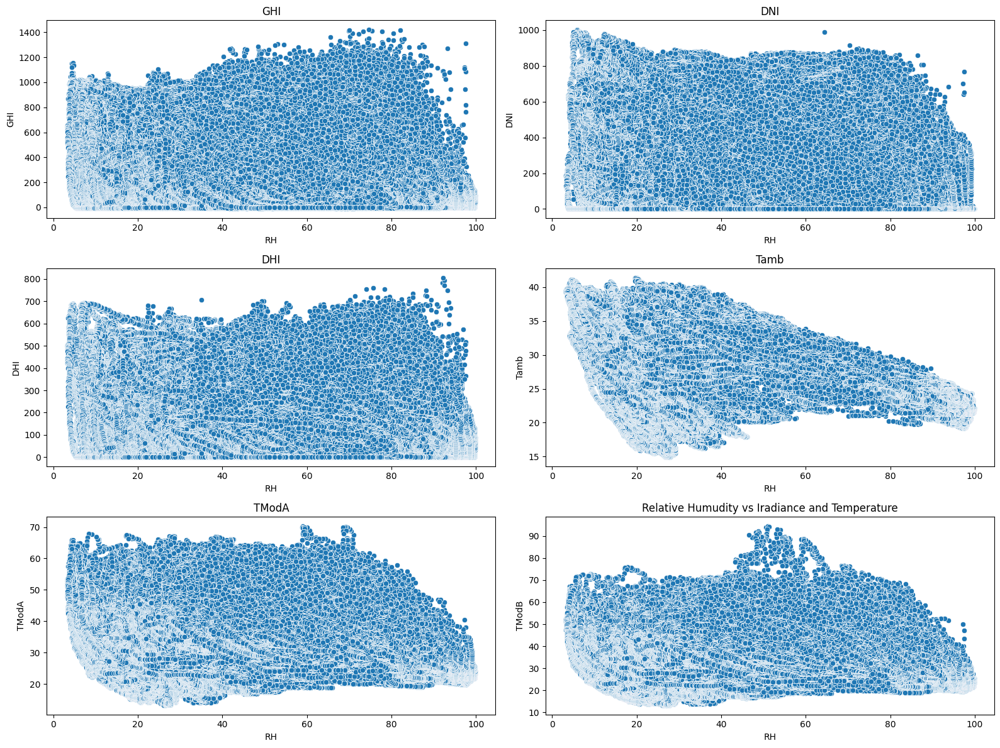

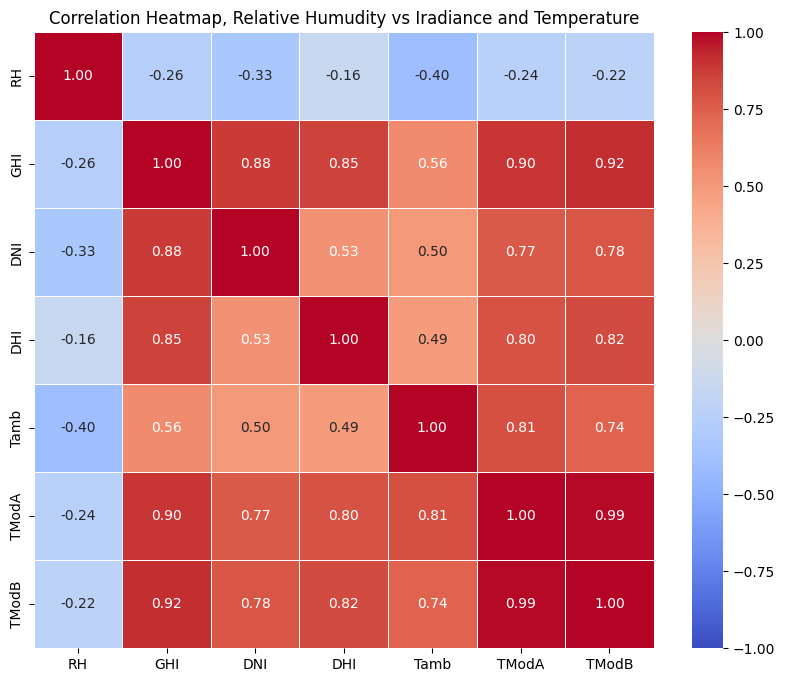

In [ ]:
def temperature_analysis():
    print("Temperature analysis")
    for key, df in dfs.items():
            # Scatter plot
        cols = ['GHI', 'DNI', 'DHI', 'Tamb','TModA','TModB']

        # Create a 2x2 grid of subplots
        fig, axs = plt.subplots(3, 2, figsize=(16, 12))

        for i, col in enumerate(cols):
            # Scatter plot for each column
            sns.scatterplot(data=df, x='RH', y=col, ax=axs[i // 2, i % 2])
            axs[i // 2, i % 2].set_title(col)
            # plt.title("Relative Humudity vs Iradiance and Temperature")

        plt.tight_layout()
        plt.show()

        # Heatmap

        # Compute the correlation matrix
        cols = ['RH','GHI', 'DNI', 'DHI', 'Tamb','TModA','TModB']
        df_selected = df[cols]
        correlation_matrix = df_selected.corr()


        # Plot the heatmap
        plt.figure(figsize=(10, 8))
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, center=0, linewidths=0.5)
        plt.title('Correlation Heatmap, Relative Humudity vs Iradiance and Temperature')
        plt.show()

temperature_analysis()


## Histograms | Radiance, temperature, wind

Histograms Iradiance, temperature, wind
*************************** Benin Melanville ***************************


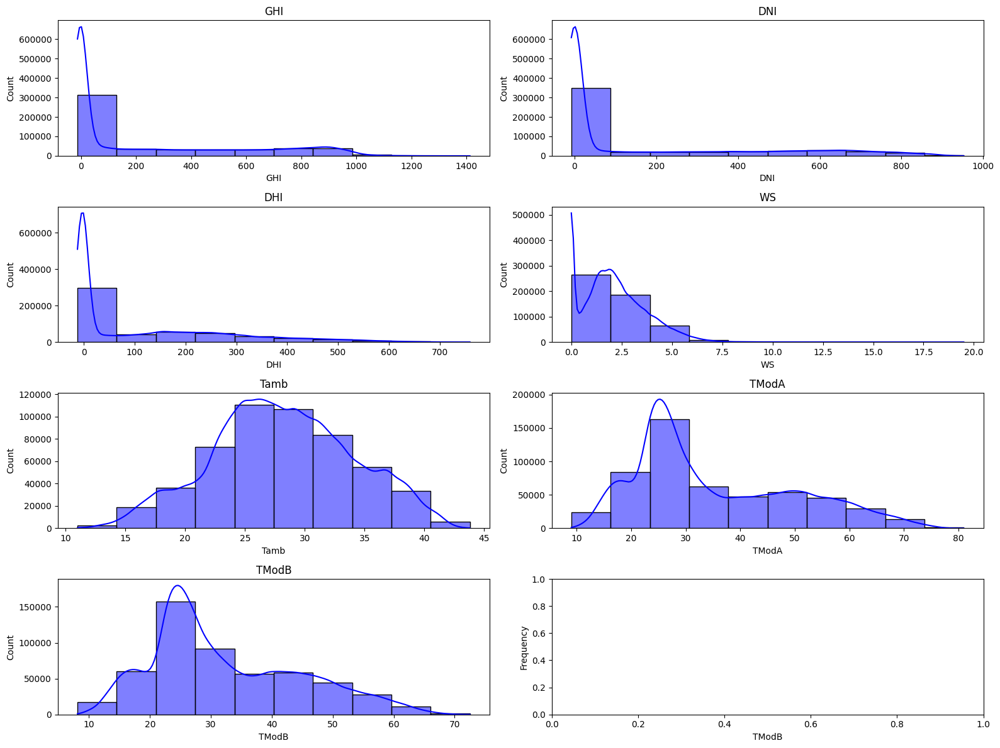

*************************** Sierraleone Bumbuna ***************************


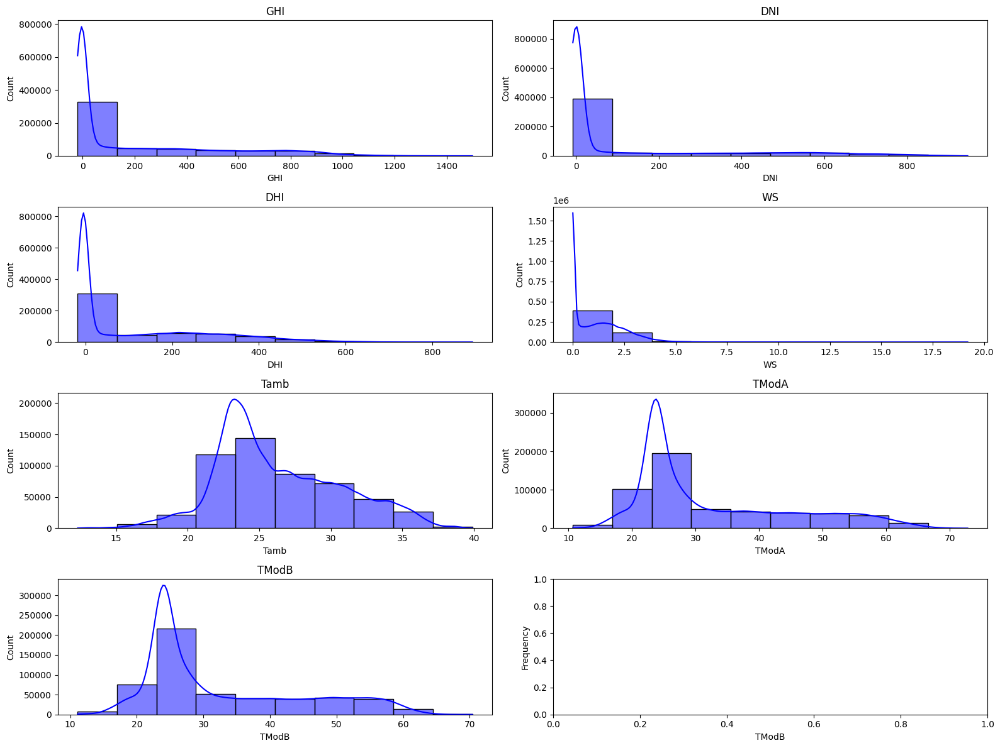

*************************** Togo Dapaong QC ***************************


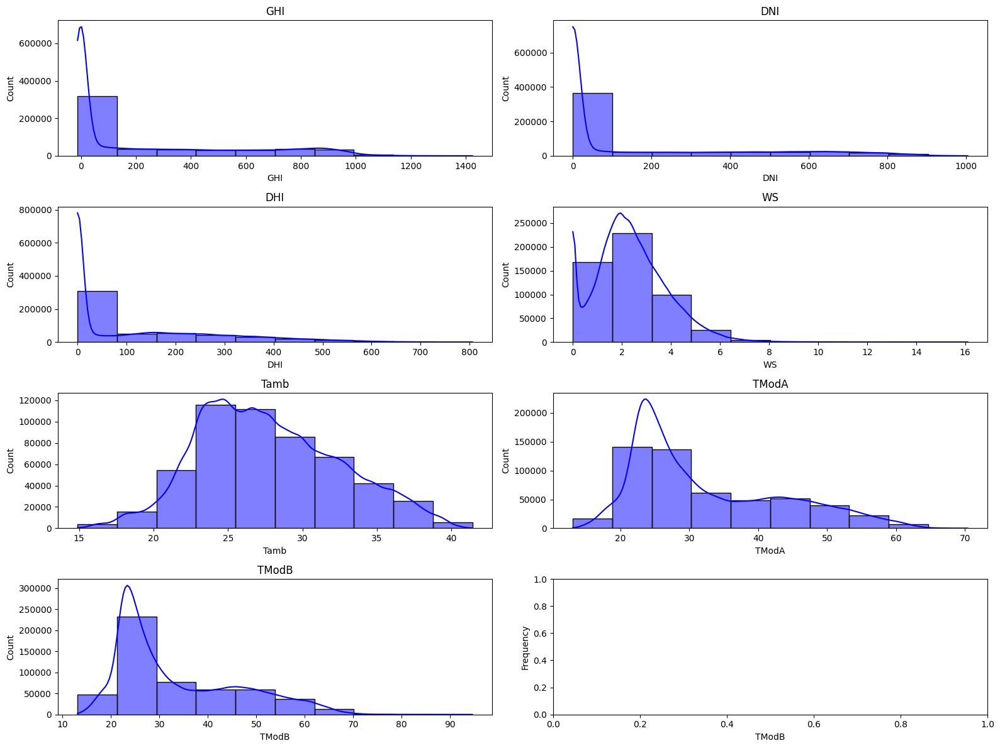

In [ ]:
def histograms():
    print("Histograms Iradiance, temperature, wind")
    for key, df in dfs.items():
        print(plot_separator(key))
        # Scatter plot
        cols = ['GHI', 'DNI', 'DHI', 'WS','Tamb','TModA','TModB']

        # Create a 2x2 grid of subplots
        fig, axs = plt.subplots(4, 2, figsize=(16, 12))

        for i, col in enumerate(cols):
            sns.histplot(df[col], bins=10, kde=True, color='blue', edgecolor='black',ax=axs[i // 2, i % 2])
            # Add titles and labels
            axs[i // 2, i % 2].set_title(col)    
            plt.xlabel(col)
            plt.ylabel('Frequency')

        # Hide the last empty subplot
        axs[-1, -1].axis('off')
        plt.tight_layout()
        plt.show()

histograms()


## Z-scores Analysis

In [16]:
# Define a threshold for outliers
threshold = 2

# Specify columns to exclude
exclude_columns = ['Timestamp', 'Timestamp_Adjusted', 'Comments']

def identify_outliers(dfs, threshold, exclude_columns):
    print('Z-scores analysis')

    for key, df in dfs.items():
        print(plot_separator(key))
        
        for column in df.columns:
            if column in exclude_columns:
                continue  # Skip excluded columns

            # Calculate mean and standard deviation
            mean = df[column].mean()
            std_dev = df[column].std()
            
            # Calculate Z-scores
            z_scores = (df[column] - mean) / std_dev
            
            # Flag outliers
            df[f'{column}_Z-score'] = z_scores
            df[f'{column}_Outlier'] = np.abs(z_scores) > threshold
    
        # Aggregate outlier information into a single column
        def flag_outlier_columns(row):
            outlier_cols = [col for col in df.columns if col.endswith('_Outlier') and row[col]]
            if outlier_cols:
                return ', '.join([col.replace('_Outlier', '') for col in outlier_cols])
            else:
                return 'none'
        
        df['Outliers'] = df.apply(flag_outlier_columns, axis=1)
        
        # Clean up temporary columns
        df.drop(columns=[col for col in df.columns if col.endswith('_Z-score') or col.endswith('_Outlier')], inplace=True)
        
        dfs[key] = df
    
    return dfs
        
  
# Apply the function to the DataFrame, excluding specified columns
dfs_with_outliers = identify_outliers(dfs, threshold, exclude_columns)

# Print the DataFrame with outliers information
for df in dfs_with_outliers.values():
    df.head()


Z-scores analysis
*************************** Benin Melanville ***************************
*************************** Sierraleone Bumbuna ***************************
*************************** Togo Dapaong QC ***************************


In [26]:
for key,df in dfs_with_outliers.items():
    print(key)
    count = len(df[df['Outliers'] != 'none'])
    print(count)
# for key, df in dfs_with_outliers.items():
#     print(plot_separator(key))
#     print(df.head(1))




Benin Melanville
144022
Sierraleone Bumbuna
144244
Togo Dapaong QC
170821


## Bubble Charts | GHI , Tamb, WS

Bubble charts


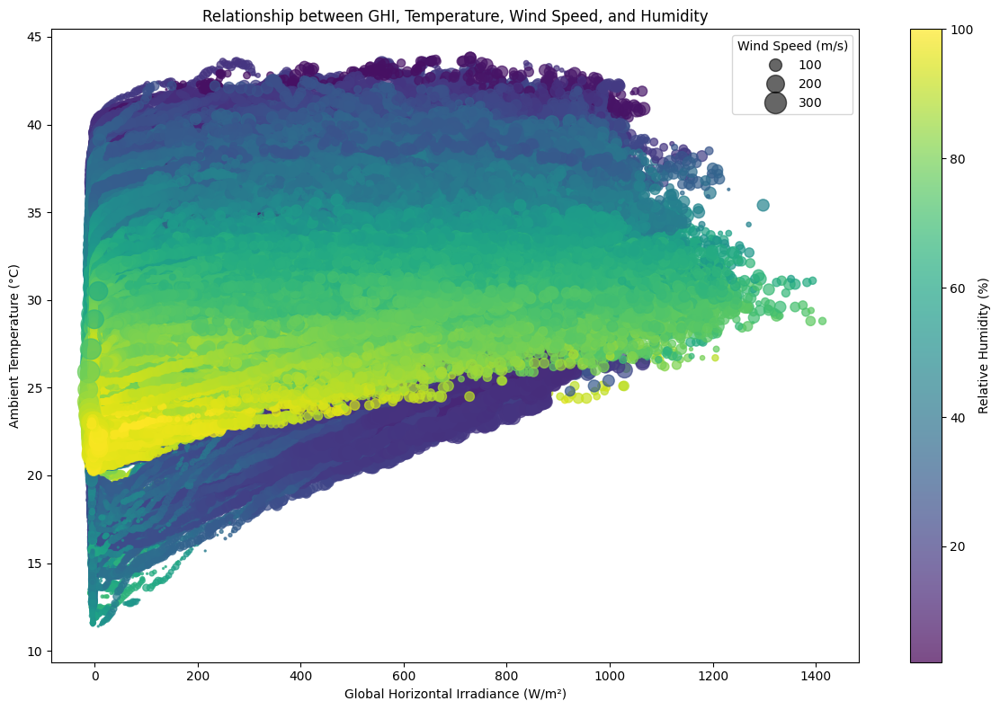


Number of points plotted: 525600


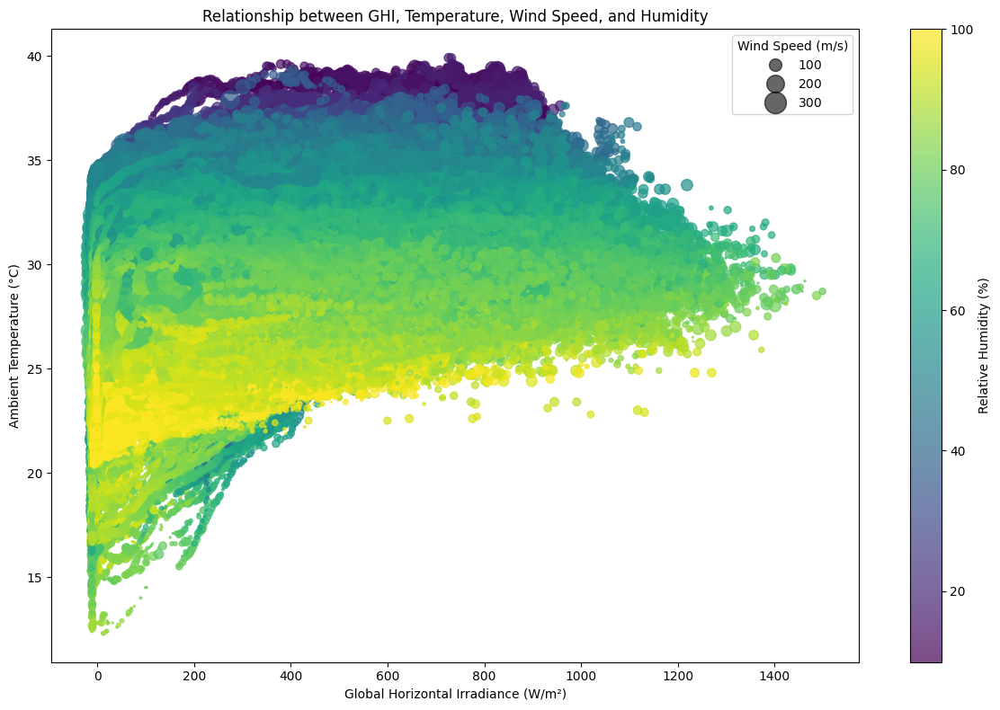


Number of points plotted: 525600


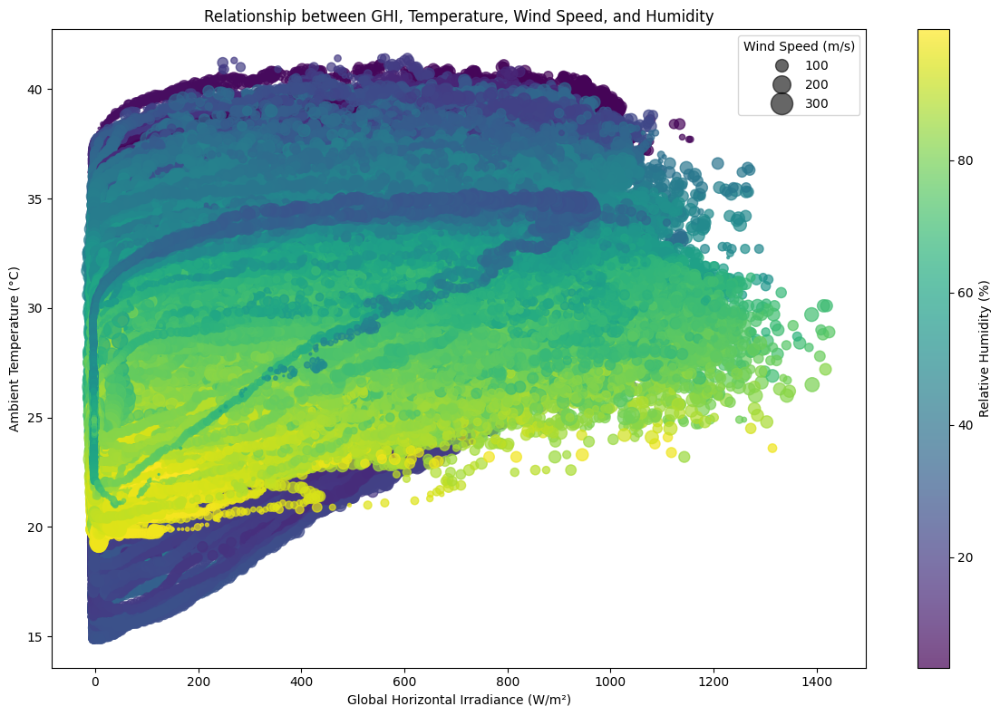


Number of points plotted: 525600


In [9]:
# Diagnostic step 3: Check the data types and some sample values

dfs = dfs_with_outliers

def bubble_charts():
    print("Bubble charts")
    for key, df in dfs.items():
        plot_separator(key)
        # Attempt to create the bubble chart
        try:
            fig, ax = plt.subplots(figsize=(12, 8))

            scatter = ax.scatter(df['GHI'], df['Tamb'], s=df['WS']*20, c=df['RH'], cmap='viridis', alpha=0.7)

            ax.set_xlabel('Global Horizontal Irradiance (W/m²)')
            ax.set_ylabel('Ambient Temperature (°C)')
            ax.set_title('Relationship between GHI, Temperature, Wind Speed, and Humidity')

            cbar = plt.colorbar(scatter)
            cbar.set_label('Relative Humidity (%)')

            handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6, num=4)
            size_legend = ax.legend(handles, labels, loc="upper right", title="Wind Speed (m/s)")

            plt.tight_layout()
            plt.show()

            print(f"\nNumber of points plotted: {len(scatter.get_offsets())}")
        except Exception as e:
            print(f"Error in creating plot: {str(e)}")

bubble_charts()




### Bubble Charts | GHI , Tamb, WS | Selected Month

Bubble charts


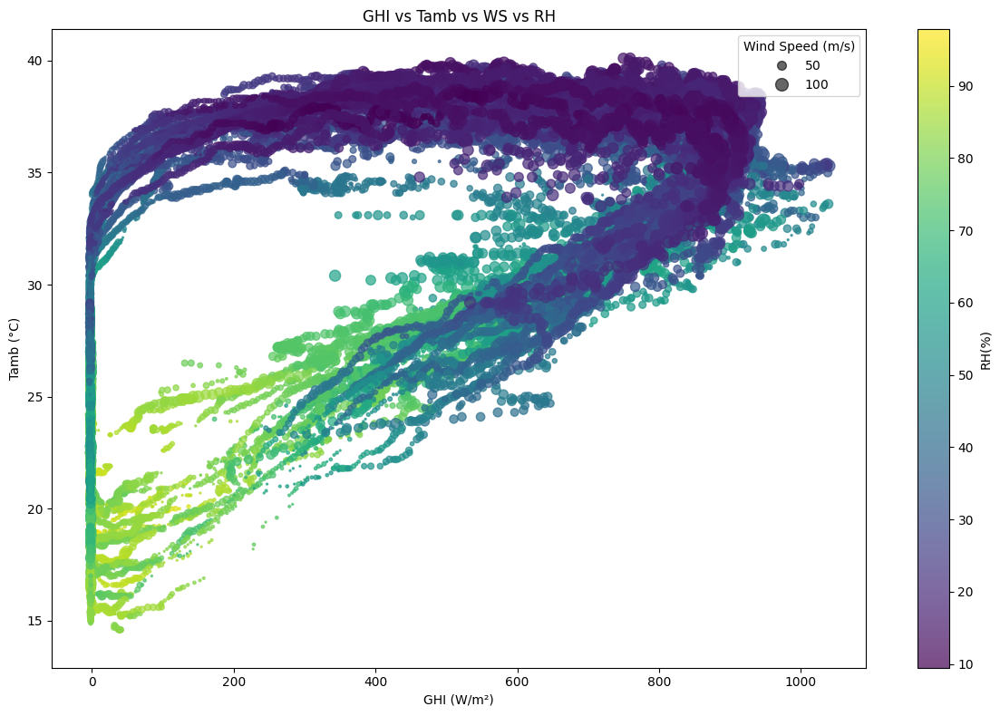


Number of points plotted: 43200


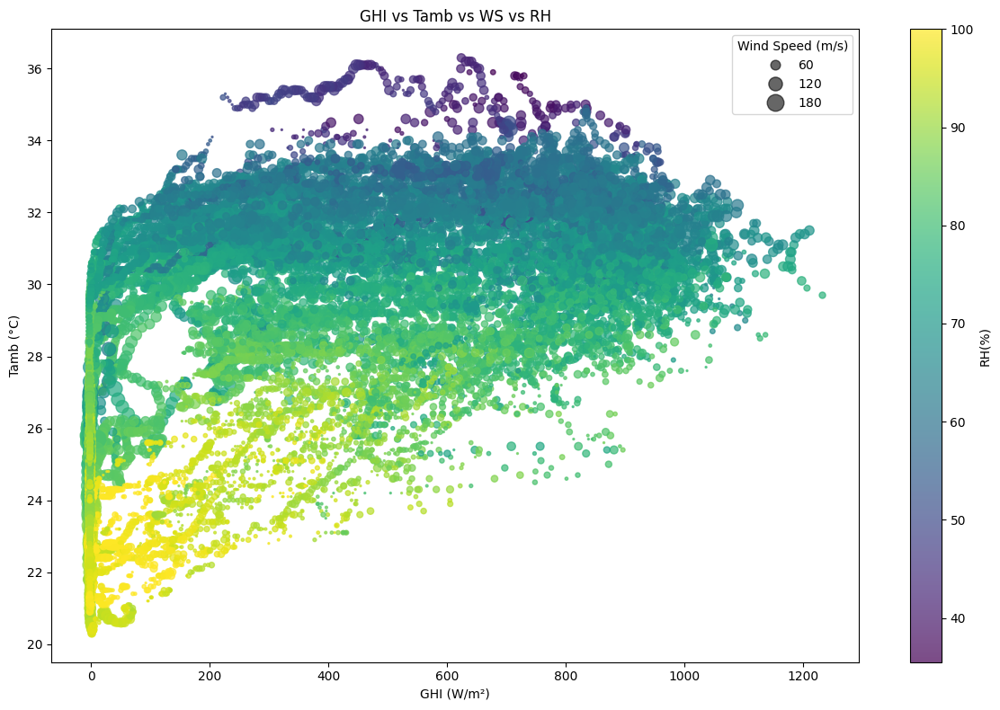


Number of points plotted: 43200


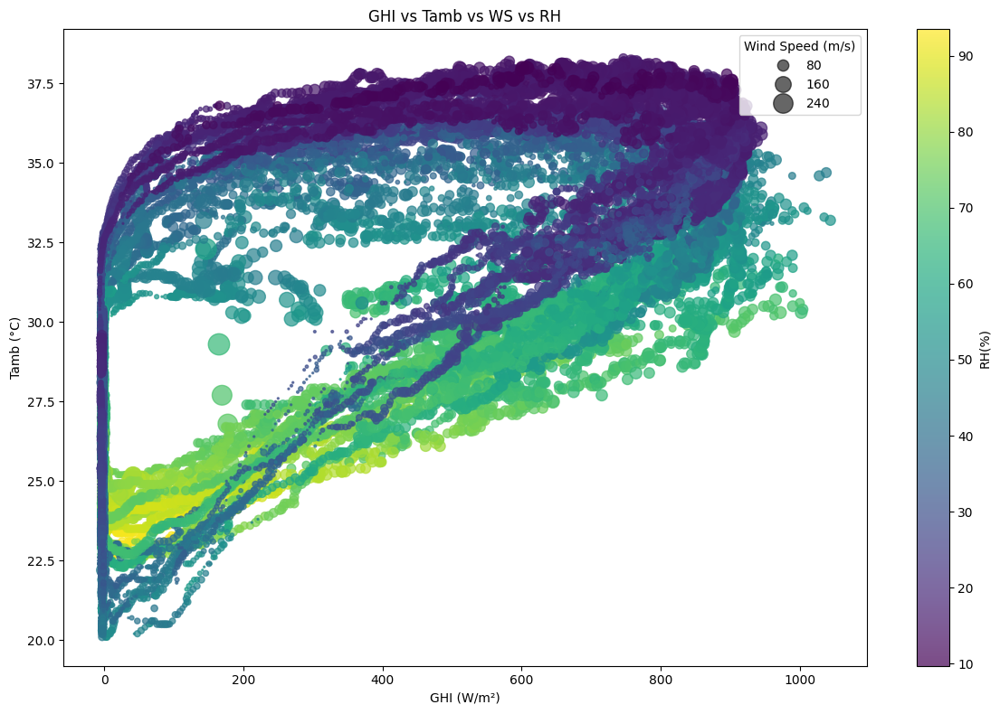


Number of points plotted: 43200


In [30]:
# Diagnostic step 3: Check the data types and some sample values

dfs = dfs_selected_month

def bubble_charts():
    print("Bubble charts")
    for key, df in dfs.items():
        plot_separator(key)
        # Attempt to create the bubble chart
        try:
            fig, ax = plt.subplots(figsize=(12, 8))

            scatter = ax.scatter(df['GHI'], df['Tamb'], s=df['WS']*20, c=df['RH'], cmap='viridis', alpha=0.7)

            ax.set_xlabel('GHI (W/m²)')
            ax.set_ylabel('Tamb (°C)')
            ax.set_title('GHI vs Tamb vs WS vs RH')

            cbar = plt.colorbar(scatter)
            cbar.set_label('RH(%)')

            handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6, num=4)
            size_legend = ax.legend(handles, labels, loc="upper right", title="Wind Speed (m/s)")

            plt.tight_layout()
            plt.show()

            print(f"\nNumber of points plotted: {len(scatter.get_offsets())}")
        except Exception as e:
            print(f"Error in creating plot: {str(e)}")

bubble_charts()




## Cleaning

In [10]:
def clean_dfs():
    print("Clean dataframes.")

    for key, df in dfs.items():
        plot_separator(key)
        df.drop(columns=['Comments'])
        dfs[key]=df
    return dfs

dfs = clean_dfs()




Clean dataframes.


In [11]:
for df in dfs.values():
    print(df.head())

          Timestamp  GHI  DNI  DHI  ModA  ModB  Tamb    RH   WS  WSgust  \
0  2021-08-09 00:01 -1.2 -0.2 -1.1   0.0   0.0  26.2  93.4  0.0     0.4   
1  2021-08-09 00:02 -1.1 -0.2 -1.1   0.0   0.0  26.2  93.6  0.0     0.0   
2  2021-08-09 00:03 -1.1 -0.2 -1.1   0.0   0.0  26.2  93.7  0.3     1.1   
3  2021-08-09 00:04 -1.1 -0.1 -1.0   0.0   0.0  26.2  93.3  0.2     0.7   
4  2021-08-09 00:05 -1.0 -0.1 -1.0   0.0   0.0  26.2  93.3  0.1     0.7   

   WSstdev     WD  WDstdev   BP  Cleaning  Precipitation  TModA  TModB  \
0      0.1  122.1      0.0  998         0            0.0   26.3   26.2   
1      0.0    0.0      0.0  998         0            0.0   26.3   26.2   
2      0.5  124.6      1.5  997         0            0.0   26.4   26.2   
3      0.4  120.3      1.3  997         0            0.0   26.4   26.3   
4      0.3  113.2      1.0  997         0            0.0   26.4   26.3   

   Comments Outliers  
0       NaN     none  
1       NaN     none  
2       NaN     none  
3       NaN 